In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
fatal: destination path 'mmsegmentation' already exists and is not an empty directory.


In [3]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla P100-PCIE-16GB)


In [4]:
%cd mmsegmentation

/content/mmsegmentation


In [5]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [6]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [7]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

mkdir: cannot create directory ‘checkpoints’: File exists
--2022-06-07 17:03:54--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.88.36.72
Connecting to download.openmmlab.com (download.openmmlab.com)|47.88.36.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  10.5MB/s    in 30s     

2022-06-07 17:04:26 (10.4 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [8]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'road')
palette = [[0, 0, 0], [255, 255, 0]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [9]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [10]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 2

cfg.device='cuda'

cfg.model.decode_head.loss_decode = [dict(type='FocalLoss', loss_weight = 1.0),
                                    dict(type='LovaszLoss', loss_weight = 1.0, reduction='none')]

In [11]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='RandomCutOut',prob=0.5,n_holes=(1,100),cutout_ratio=(0,1)),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.val_pipeline = [
                    dict(type='LoadImageFromFile'),
                    dict(
                        type='MultiScaleFlipAug',
                        img_scale=(1024, 1024),
                        flip=False,
                        transforms=[
                                    dict(type='Resize', keep_ratio=True),
                                    dict(type='RandomFlip'),
                                    dict(
                                        type='Normalize',
                                        mean=[123.675, 116.28, 103.53],
                                        std=[58.395, 57.12, 57.375],
                                        to_rgb=True),
                                    dict(type='ImageToTensor', keys=['img']),
                                    dict(type='Collect', keys=['img'])
                                    ]),
                    
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            #dict(type='ResizeToMultiple', size_divisor=32),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [12]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/road_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/road_dataset/ann_01_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/train/up_train_road.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/road_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/road_dataset/ann_01_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/train/up_val_road.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/road_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/road_dataset/ann_01_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/val/up.txt'

In [13]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/FL_cutout'

In [14]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=2,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=[
            dict(type='FocalLoss', loss_weight=1.0),
            dict(type='LovaszLoss', los

### 모델 학습

In [15]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-06-07 17:04:27,758 - mmseg - INFO - Loaded 542 images
2022-06-07 17:04:31,553 - mmseg - INFO - Loaded 66 images
2022-06-07 17:04:31,556 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-06-07 17:04:31,999 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with shape torch.Size([19]) from checkpoint, the shape in current model is torch.Size([2]).
2022-06-07 17:04:32,010 - mmseg - INFO - Start running, host: root@868541315e04, work_dir: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/FL_cutout
2022-06-07 17:04:32,011 - mmseg - INFO - Hooks will be executed in the following order:
before_run:
(VERY_

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 252s, ETA:     0s

2022-06-07 17:14:06,579 - mmseg - INFO - per class results:
2022-06-07 17:14:06,581 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.49 | 95.52 |
|    road    | 59.93 | 72.96 |
+------------+-------+-------+
2022-06-07 17:14:06,583 - mmseg - INFO - Summary:
2022-06-07 17:14:06,584 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.67 | 75.21 | 84.24 |
+-------+-------+-------+
2022-06-07 17:14:06,587 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9167, mIoU: 0.7521, mAcc: 0.8424, IoU.background: 0.9049, IoU.road: 0.5993, Acc.background: 0.9552, Acc.road: 0.7296
2022-06-07 17:14:39,893 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 2:54:03, time: 2.856, data_time: 2.549, memory: 3323, decode.loss_focal: 0.0464, decode.loss_lovasz: 0.3073, decode.acc_seg: 89.4562, loss: 0.3537
2022-06-07 17:15:11,166 - mmseg - INFO - Iter [1200/20000]	lr: 4.508e-05, eta: 2:46

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 17:23:43,098 - mmseg - INFO - per class results:
2022-06-07 17:23:43,100 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.9 | 95.89 |
|    road    | 61.14 | 73.36 |
+------------+-------+-------+
2022-06-07 17:23:43,102 - mmseg - INFO - Summary:
2022-06-07 17:23:43,106 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.04 | 76.02 | 84.62 |
+-------+-------+-------+
2022-06-07 17:23:43,109 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9204, mIoU: 0.7602, mAcc: 0.8462, IoU.background: 0.9090, IoU.road: 0.6114, Acc.background: 0.9589, Acc.road: 0.7336
2022-06-07 17:24:14,425 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 2:47:58, time: 2.824, data_time: 2.516, memory: 3323, decode.loss_focal: 0.0408, decode.loss_lovasz: 0.2705, decode.acc_seg: 90.8702, loss: 0.3113
2022-06-07 17:24:47,779 - mmseg - INFO - Iter [2200/20000]	lr: 5.340e-05, eta: 2:43

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 17:33:18,922 - mmseg - INFO - per class results:
2022-06-07 17:33:18,924 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.16 |  96.0 |
|    road    | 62.13 | 74.19 |
+------------+-------+-------+
2022-06-07 17:33:18,926 - mmseg - INFO - Summary:
2022-06-07 17:33:18,928 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.28 | 76.64 | 85.1 |
+-------+-------+------+
2022-06-07 17:33:18,930 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9228, mIoU: 0.7664, mAcc: 0.8510, IoU.background: 0.9116, IoU.road: 0.6213, Acc.background: 0.9600, Acc.road: 0.7419
2022-06-07 17:33:50,342 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 2:39:45, time: 2.825, data_time: 2.517, memory: 3323, decode.loss_focal: 0.0411, decode.loss_lovasz: 0.2577, decode.acc_seg: 91.1012, loss: 0.2988
2022-06-07 17:34:21,726 - mmseg - INFO - Iter [3200/20000]	lr: 5.040e-05, eta: 2:36:35, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 17:42:56,539 - mmseg - INFO - per class results:
2022-06-07 17:42:56,541 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.48 | 96.48 |
|    road    | 62.72 | 73.45 |
+------------+-------+-------+
2022-06-07 17:42:56,544 - mmseg - INFO - Summary:
2022-06-07 17:42:56,546 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.55 | 77.1 | 84.97 |
+-------+------+-------+
2022-06-07 17:42:56,549 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9255, mIoU: 0.7710, mAcc: 0.8497, IoU.background: 0.9148, IoU.road: 0.6272, Acc.background: 0.9648, Acc.road: 0.7345
2022-06-07 17:43:28,204 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 2:30:59, time: 2.827, data_time: 2.516, memory: 3323, decode.loss_focal: 0.0371, decode.loss_lovasz: 0.2468, decode.acc_seg: 91.9001, loss: 0.2839
2022-06-07 17:43:59,729 - mmseg - INFO - Iter [4200/20000]	lr: 4.740e-05, eta: 2:28:26, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 17:52:34,418 - mmseg - INFO - per class results:
2022-06-07 17:52:34,420 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.76 | 96.79 |
|    road    | 63.44 | 73.34 |
+------------+-------+-------+
2022-06-07 17:52:34,422 - mmseg - INFO - Summary:
2022-06-07 17:52:34,424 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.79 | 77.6 | 85.06 |
+-------+------+-------+
2022-06-07 17:52:34,427 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9279, mIoU: 0.7760, mAcc: 0.8506, IoU.background: 0.9176, IoU.road: 0.6344, Acc.background: 0.9679, Acc.road: 0.7334
2022-06-07 17:53:05,741 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 2:21:52, time: 2.824, data_time: 2.516, memory: 3323, decode.loss_focal: 0.0349, decode.loss_lovasz: 0.2394, decode.acc_seg: 92.4120, loss: 0.2743
2022-06-07 17:53:37,118 - mmseg - INFO - Iter [5200/20000]	lr: 4.440e-05, eta: 2:19:41, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 18:02:10,782 - mmseg - INFO - per class results:
2022-06-07 18:02:10,784 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.65 | 95.97 |
|    road    | 64.48 | 77.11 |
+------------+-------+-------+
2022-06-07 18:02:10,786 - mmseg - INFO - Summary:
2022-06-07 18:02:10,788 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.75 | 78.07 | 86.54 |
+-------+-------+-------+
2022-06-07 18:02:10,792 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9275, mIoU: 0.7807, mAcc: 0.8654, IoU.background: 0.9165, IoU.road: 0.6448, Acc.background: 0.9597, Acc.road: 0.7711
2022-06-07 18:02:42,401 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 2:12:33, time: 2.827, data_time: 2.516, memory: 3323, decode.loss_focal: 0.0345, decode.loss_lovasz: 0.2282, decode.acc_seg: 92.7977, loss: 0.2628
2022-06-07 18:03:13,844 - mmseg - INFO - Iter [6200/20000]	lr: 4.140e-05, eta: 2:10

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 18:11:46,950 - mmseg - INFO - per class results:
2022-06-07 18:11:46,951 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.67 | 95.88 |
|    road    | 64.76 | 77.73 |
+------------+-------+-------+
2022-06-07 18:11:46,953 - mmseg - INFO - Summary:
2022-06-07 18:11:46,955 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.78 | 78.22 | 86.8 |
+-------+-------+------+
2022-06-07 18:11:46,958 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9278, mIoU: 0.7822, mAcc: 0.8680, IoU.background: 0.9167, IoU.road: 0.6476, Acc.background: 0.9588, Acc.road: 0.7773
2022-06-07 18:12:20,422 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 2:03:11, time: 2.845, data_time: 2.537, memory: 3323, decode.loss_focal: 0.0378, decode.loss_lovasz: 0.2405, decode.acc_seg: 92.0199, loss: 0.2783
2022-06-07 18:12:51,646 - mmseg - INFO - Iter [7200/20000]	lr: 3.840e-05, eta: 2:01:28, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 18:21:23,952 - mmseg - INFO - per class results:
2022-06-07 18:21:23,954 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.65 | 95.78 |
|    road    |  64.8 | 78.08 |
+------------+-------+-------+
2022-06-07 18:21:23,956 - mmseg - INFO - Summary:
2022-06-07 18:21:23,958 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.76 | 78.22 | 86.93 |
+-------+-------+-------+
2022-06-07 18:21:23,960 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9276, mIoU: 0.7822, mAcc: 0.8693, IoU.background: 0.9165, IoU.road: 0.6480, Acc.background: 0.9578, Acc.road: 0.7808
2022-06-07 18:21:55,278 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 1:53:41, time: 2.823, data_time: 2.516, memory: 3323, decode.loss_focal: 0.0342, decode.loss_lovasz: 0.2262, decode.acc_seg: 92.8012, loss: 0.2604
2022-06-07 18:22:28,780 - mmseg - INFO - Iter [8200/20000]	lr: 3.540e-05, eta: 1:52

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 18:31:02,751 - mmseg - INFO - per class results:
2022-06-07 18:31:02,753 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.96 | 96.34 |
|    road    | 65.27 | 76.89 |
+------------+-------+-------+
2022-06-07 18:31:02,754 - mmseg - INFO - Summary:
2022-06-07 18:31:02,757 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.02 | 78.61 | 86.61 |
+-------+-------+-------+
2022-06-07 18:31:02,762 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9302, mIoU: 0.7861, mAcc: 0.8661, IoU.background: 0.9196, IoU.road: 0.6527, Acc.background: 0.9634, Acc.road: 0.7689
2022-06-07 18:31:34,070 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 1:44:14, time: 2.824, data_time: 2.516, memory: 3323, decode.loss_focal: 0.0365, decode.loss_lovasz: 0.2313, decode.acc_seg: 92.0885, loss: 0.2678
2022-06-07 18:32:05,522 - mmseg - INFO - Iter [9200/20000]	lr: 3.240e-05, eta: 1:42

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 18:40:40,028 - mmseg - INFO - per class results:
2022-06-07 18:40:40,030 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.99 | 96.09 |
|    road    | 65.83 | 78.33 |
+------------+-------+-------+
2022-06-07 18:40:40,031 - mmseg - INFO - Summary:
2022-06-07 18:40:40,035 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.06 | 78.91 | 87.21 |
+-------+-------+-------+
2022-06-07 18:40:40,036 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9306, mIoU: 0.7891, mAcc: 0.8721, IoU.background: 0.9199, IoU.road: 0.6583, Acc.background: 0.9609, Acc.road: 0.7833
2022-06-07 18:41:11,488 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 1:34:44, time: 2.825, data_time: 2.516, memory: 3323, decode.loss_focal: 0.0329, decode.loss_lovasz: 0.2193, decode.acc_seg: 92.9662, loss: 0.2522
2022-06-07 18:41:43,070 - mmseg - INFO - Iter [10200/20000]	lr: 2.940e-05, eta: 1:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 18:50:16,358 - mmseg - INFO - per class results:
2022-06-07 18:50:16,361 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.98 | 96.03 |
|    road    | 65.92 | 78.64 |
+------------+-------+-------+
2022-06-07 18:50:16,362 - mmseg - INFO - Summary:
2022-06-07 18:50:16,364 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.06 | 78.95 | 87.33 |
+-------+-------+-------+
2022-06-07 18:50:16,365 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9306, mIoU: 0.7895, mAcc: 0.8733, IoU.background: 0.9198, IoU.road: 0.6592, Acc.background: 0.9603, Acc.road: 0.7864
2022-06-07 18:50:47,775 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 1:25:11, time: 2.824, data_time: 2.516, memory: 3323, decode.loss_focal: 0.0310, decode.loss_lovasz: 0.1990, decode.acc_seg: 93.6045, loss: 0.2300
2022-06-07 18:51:19,238 - mmseg - INFO - Iter [11200/20000]	lr: 2.640e-05, eta: 1:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 18:59:53,982 - mmseg - INFO - per class results:
2022-06-07 18:59:53,983 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.97 | 95.89 |
|    road    | 66.07 | 79.27 |
+------------+-------+-------+
2022-06-07 18:59:53,985 - mmseg - INFO - Summary:
2022-06-07 18:59:53,986 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.05 | 79.02 | 87.58 |
+-------+-------+-------+
2022-06-07 18:59:53,988 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9305, mIoU: 0.7902, mAcc: 0.8758, IoU.background: 0.9197, IoU.road: 0.6607, Acc.background: 0.9589, Acc.road: 0.7927
2022-06-07 19:00:25,221 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 1:15:39, time: 2.822, data_time: 2.515, memory: 3323, decode.loss_focal: 0.0334, decode.loss_lovasz: 0.2092, decode.acc_seg: 93.0095, loss: 0.2426
2022-06-07 19:00:56,501 - mmseg - INFO - Iter [12200/20000]	lr: 2.340e-05, eta: 1:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 19:09:27,348 - mmseg - INFO - per class results:
2022-06-07 19:09:27,350 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.02 | 96.58 |
|    road    |  65.1 | 75.93 |
+------------+-------+-------+
2022-06-07 19:09:27,351 - mmseg - INFO - Summary:
2022-06-07 19:09:27,355 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.05 | 78.56 | 86.25 |
+-------+-------+-------+
2022-06-07 19:09:27,358 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9305, mIoU: 0.7856, mAcc: 0.8625, IoU.background: 0.9202, IoU.road: 0.6510, Acc.background: 0.9658, Acc.road: 0.7593
2022-06-07 19:10:00,821 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 1:06:05, time: 2.844, data_time: 2.536, memory: 3323, decode.loss_focal: 0.0315, decode.loss_lovasz: 0.1997, decode.acc_seg: 93.4590, loss: 0.2312
2022-06-07 19:10:32,159 - mmseg - INFO - Iter [13200/20000]	lr: 2.040e-05, eta: 1:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 19:19:03,370 - mmseg - INFO - per class results:
2022-06-07 19:19:03,372 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.14 | 96.48 |
|    road    | 65.84 |  77.1 |
+------------+-------+-------+
2022-06-07 19:19:03,375 - mmseg - INFO - Summary:
2022-06-07 19:19:03,377 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.17 | 78.99 | 86.79 |
+-------+-------+-------+
2022-06-07 19:19:03,379 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9317, mIoU: 0.7899, mAcc: 0.8679, IoU.background: 0.9214, IoU.road: 0.6584, Acc.background: 0.9648, Acc.road: 0.7710
2022-06-07 19:19:37,028 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 0:56:31, time: 2.849, data_time: 2.539, memory: 3323, decode.loss_focal: 0.0293, decode.loss_lovasz: 0.1810, decode.acc_seg: 94.0067, loss: 0.2103
2022-06-07 19:20:08,911 - mmseg - INFO - Iter [14200/20000]	lr: 1.740e-05, eta: 0:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 19:28:47,546 - mmseg - INFO - per class results:
2022-06-07 19:28:47,547 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.98 | 96.04 |
|    road    | 65.88 | 78.56 |
+------------+-------+-------+
2022-06-07 19:28:47,549 - mmseg - INFO - Summary:
2022-06-07 19:28:47,553 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.06 | 78.93 | 87.3 |
+-------+-------+------+
2022-06-07 19:28:47,554 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9306, mIoU: 0.7893, mAcc: 0.8730, IoU.background: 0.9198, IoU.road: 0.6588, Acc.background: 0.9604, Acc.road: 0.7856
2022-06-07 19:29:19,249 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 0:46:58, time: 2.831, data_time: 2.520, memory: 3323, decode.loss_focal: 0.0310, decode.loss_lovasz: 0.1989, decode.acc_seg: 93.4366, loss: 0.2299
2022-06-07 19:29:52,968 - mmseg - INFO - Iter [15200/20000]	lr: 1.440e-05, eta: 0:45:53

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 19:38:22,872 - mmseg - INFO - per class results:
2022-06-07 19:38:22,875 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.15 |  96.2 |
|    road    |  66.4 | 78.66 |
+------------+-------+-------+
2022-06-07 19:38:22,876 - mmseg - INFO - Summary:
2022-06-07 19:38:22,878 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.21 | 79.28 | 87.43 |
+-------+-------+-------+
2022-06-07 19:38:22,880 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9321, mIoU: 0.7928, mAcc: 0.8743, IoU.background: 0.9215, IoU.road: 0.6640, Acc.background: 0.9620, Acc.road: 0.7866
2022-06-07 19:38:54,162 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 0:37:23, time: 2.822, data_time: 2.515, memory: 3323, decode.loss_focal: 0.0262, decode.loss_lovasz: 0.1731, decode.acc_seg: 94.6504, loss: 0.1993
2022-06-07 19:39:25,455 - mmseg - INFO - Iter [16200/20000]	lr: 1.140e-05, eta: 0:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 19:47:57,502 - mmseg - INFO - per class results:
2022-06-07 19:47:57,504 - mmseg - INFO - 
+------------+------+-------+
|   Class    | IoU  |  Acc  |
+------------+------+-------+
| background | 92.3 | 96.88 |
|    road    | 65.9 | 75.89 |
+------------+------+-------+
2022-06-07 19:47:57,506 - mmseg - INFO - Summary:
2022-06-07 19:47:57,511 - mmseg - INFO - 
+------+------+-------+
| aAcc | mIoU |  mAcc |
+------+------+-------+
| 93.3 | 79.1 | 86.38 |
+------+------+-------+
2022-06-07 19:47:57,512 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9330, mIoU: 0.7910, mAcc: 0.8638, IoU.background: 0.9230, IoU.road: 0.6590, Acc.background: 0.9688, Acc.road: 0.7589
2022-06-07 19:48:28,661 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:27:48, time: 2.821, data_time: 2.515, memory: 3323, decode.loss_focal: 0.0278, decode.loss_lovasz: 0.1878, decode.acc_seg: 94.1484, loss: 0.2156
2022-06-07 19:49:00,023 - mmseg - INFO - Iter [17200/20000]	lr: 8.403e-06, eta: 0:26:46, time: 0.3

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 19:57:33,268 - mmseg - INFO - per class results:
2022-06-07 19:57:33,270 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.16 | 96.24 |
|    road    | 66.34 | 78.45 |
+------------+-------+-------+
2022-06-07 19:57:33,272 - mmseg - INFO - Summary:
2022-06-07 19:57:33,275 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.21 | 79.25 | 87.35 |
+-------+-------+-------+
2022-06-07 19:57:33,278 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9321, mIoU: 0.7925, mAcc: 0.8735, IoU.background: 0.9216, IoU.road: 0.6634, Acc.background: 0.9624, Acc.road: 0.7845
2022-06-07 19:58:04,444 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:18:12, time: 2.821, data_time: 2.514, memory: 3323, decode.loss_focal: 0.0284, decode.loss_lovasz: 0.1882, decode.acc_seg: 94.0186, loss: 0.2166
2022-06-07 19:58:35,746 - mmseg - INFO - Iter [18200/20000]	lr: 5.403e-06, eta: 0:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 20:07:07,989 - mmseg - INFO - per class results:
2022-06-07 20:07:07,991 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.28 | 96.75 |
|    road    | 66.02 | 76.43 |
+------------+-------+-------+
2022-06-07 20:07:07,993 - mmseg - INFO - Summary:
2022-06-07 20:07:07,995 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.29 | 79.15 | 86.59 |
+-------+-------+-------+
2022-06-07 20:07:08,000 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9329, mIoU: 0.7915, mAcc: 0.8659, IoU.background: 0.9228, IoU.road: 0.6602, Acc.background: 0.9675, Acc.road: 0.7643
2022-06-07 20:07:39,212 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:08:37, time: 2.821, data_time: 2.514, memory: 3323, decode.loss_focal: 0.0259, decode.loss_lovasz: 0.1828, decode.acc_seg: 94.3810, loss: 0.2087
2022-06-07 20:08:10,304 - mmseg - INFO - Iter [19200/20000]	lr: 2.403e-06, eta: 0:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.3 task/s, elapsed: 251s, ETA:     0s

2022-06-07 20:16:40,038 - mmseg - INFO - per class results:
2022-06-07 20:16:40,041 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.25 | 96.49 |
|    road    | 66.33 | 77.64 |
+------------+-------+-------+
2022-06-07 20:16:40,042 - mmseg - INFO - Summary:
2022-06-07 20:16:40,044 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.27 | 79.29 | 87.07 |
+-------+-------+-------+
2022-06-07 20:16:40,047 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9327, mIoU: 0.7929, mAcc: 0.8707, IoU.background: 0.9225, IoU.road: 0.6633, Acc.background: 0.9649, Acc.road: 0.7764


### 모델 결과 시각화

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/FL_cutout/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


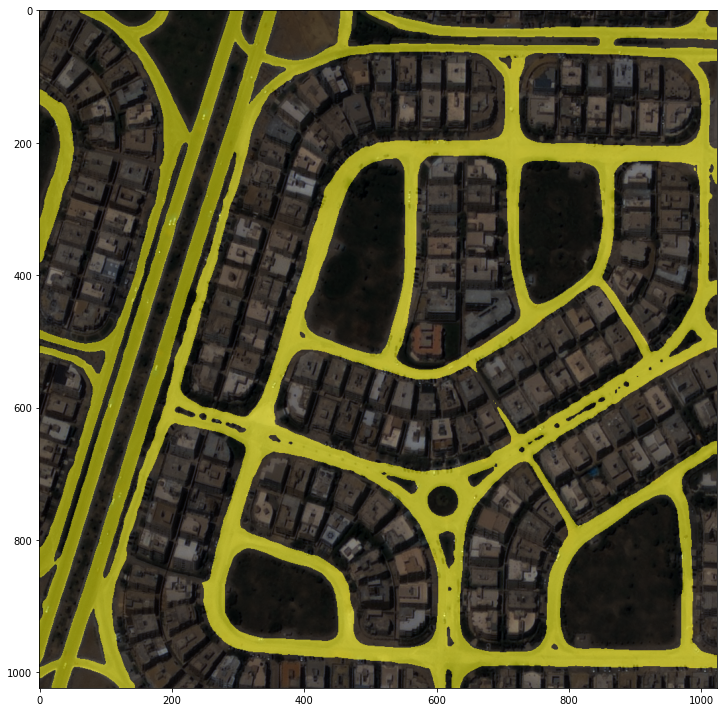

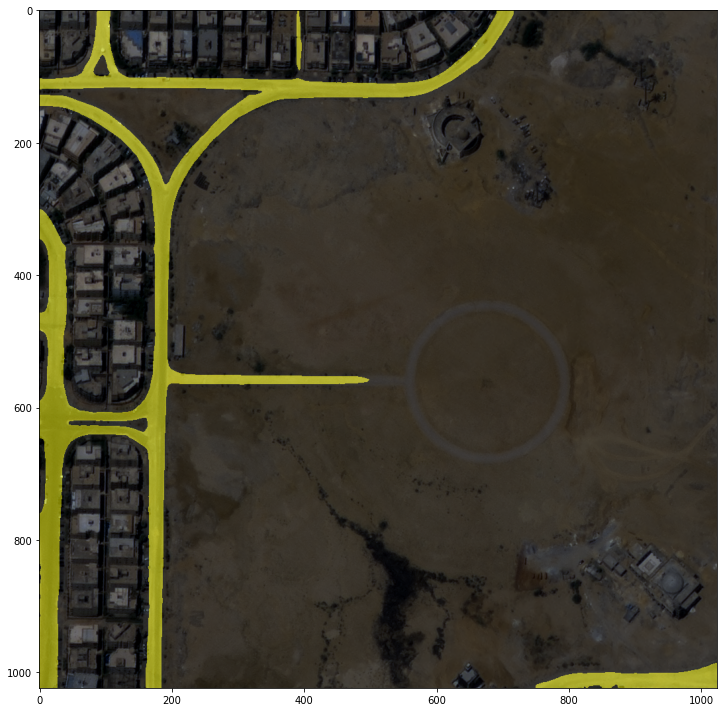

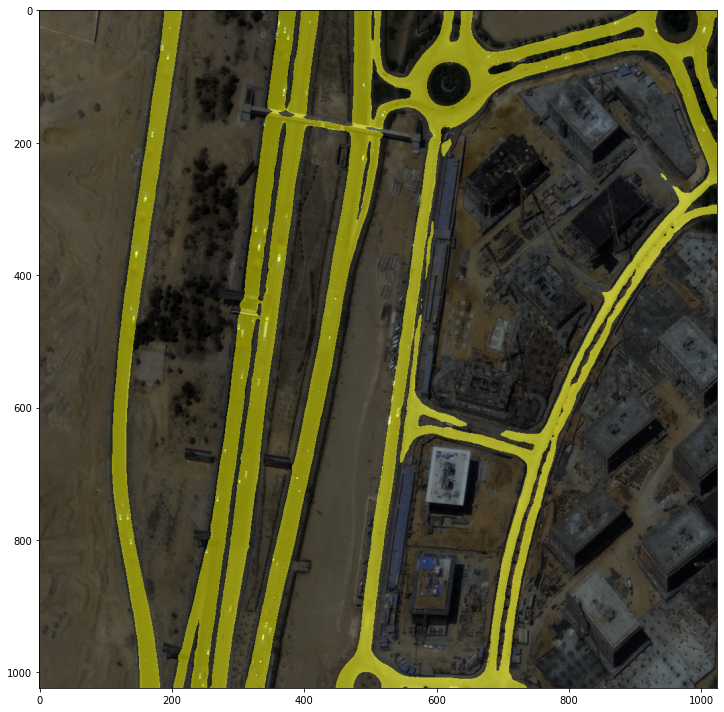

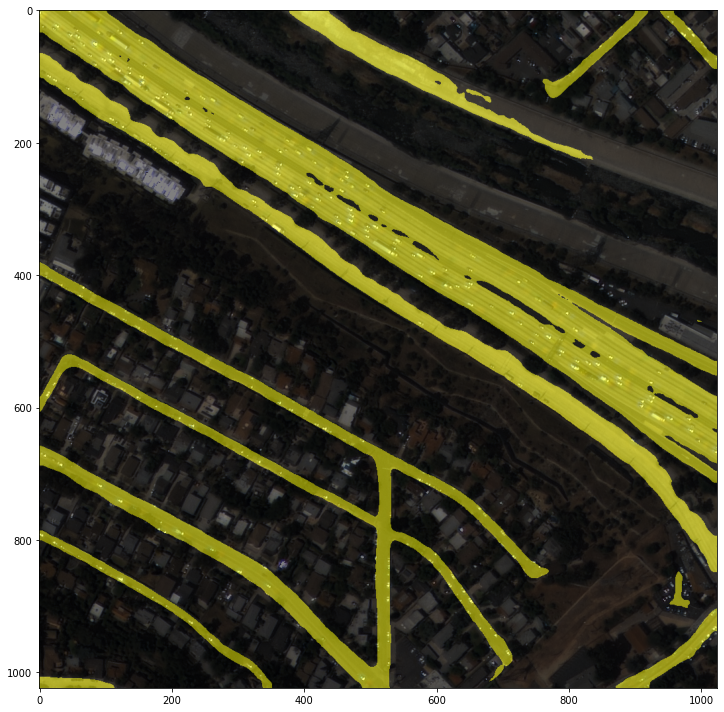

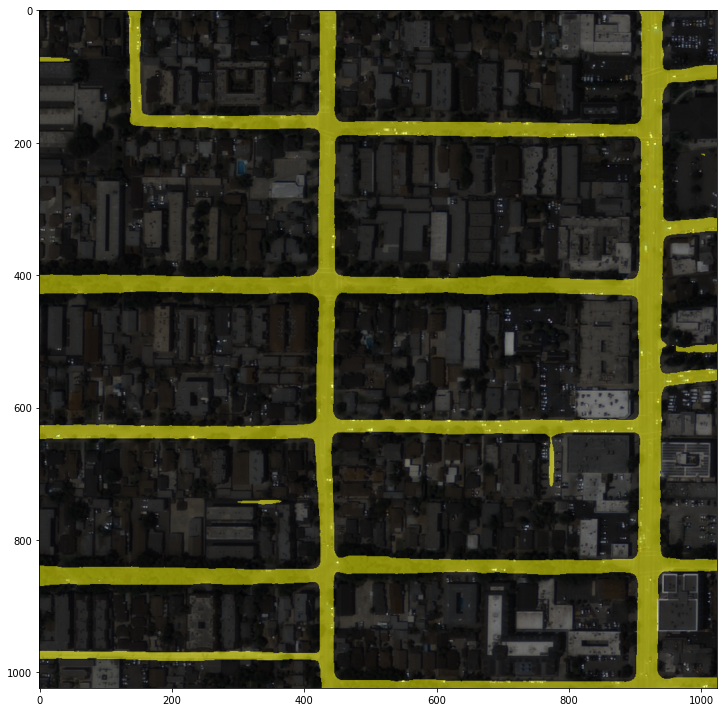

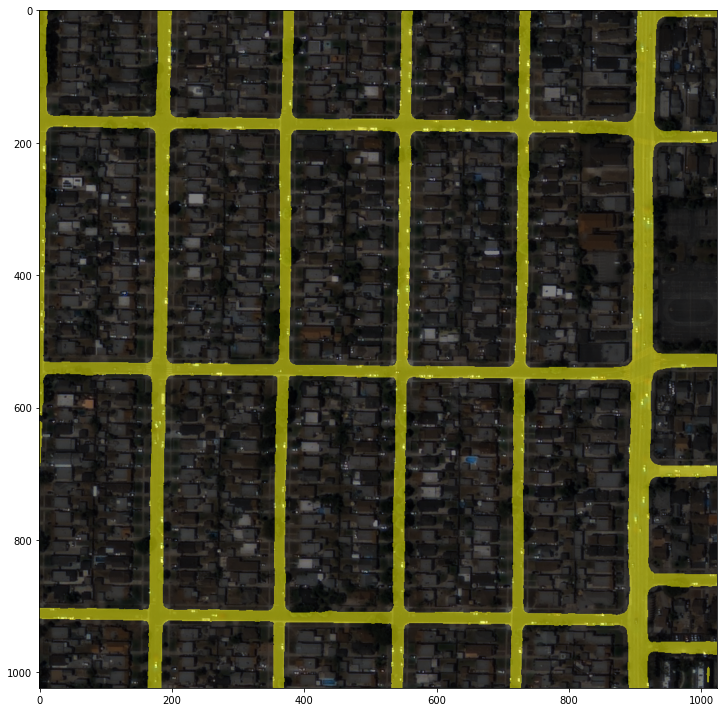

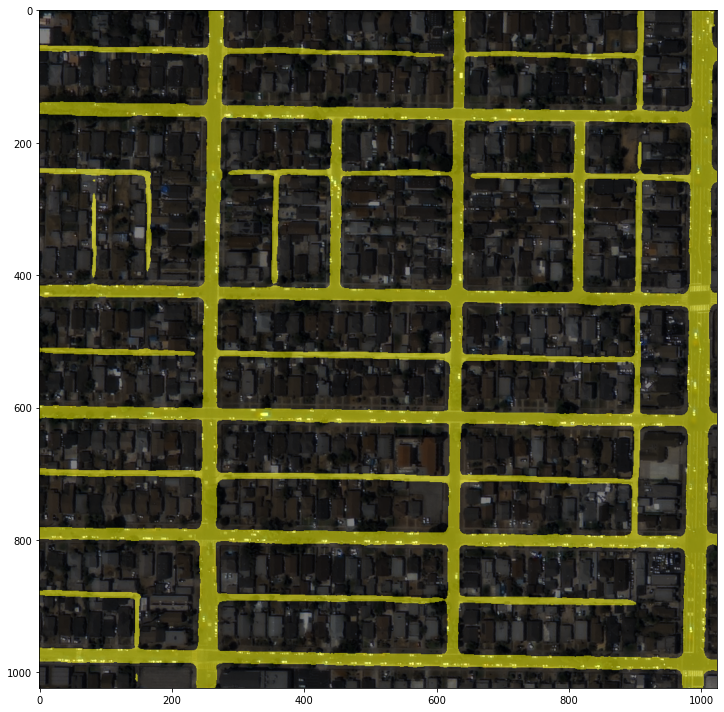

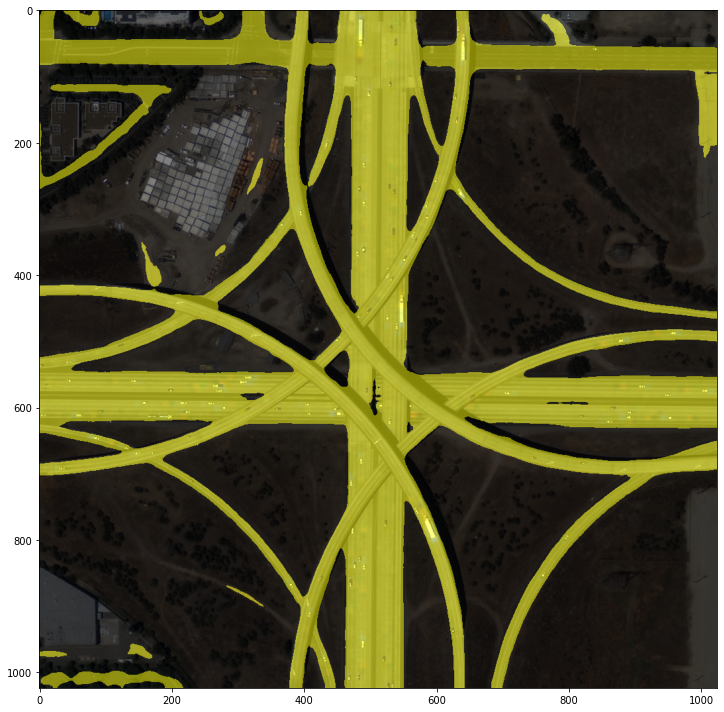

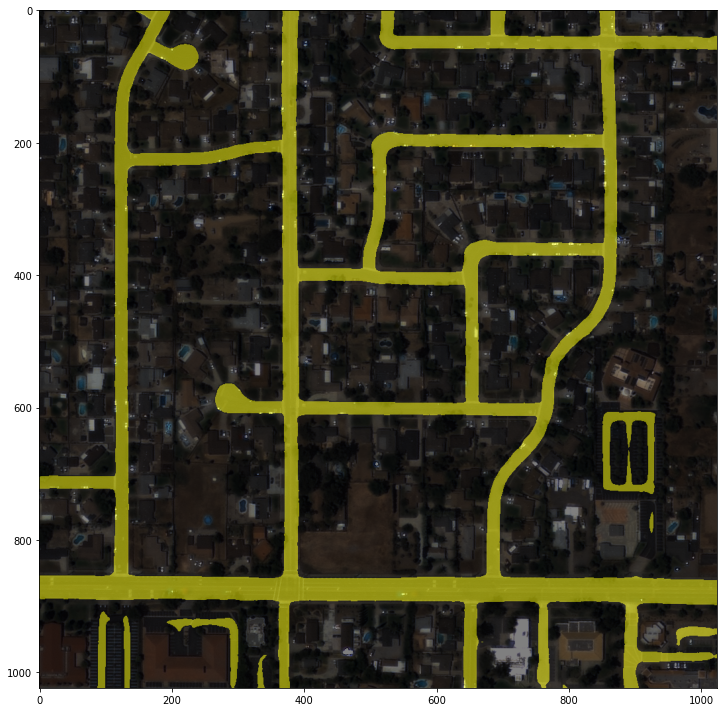

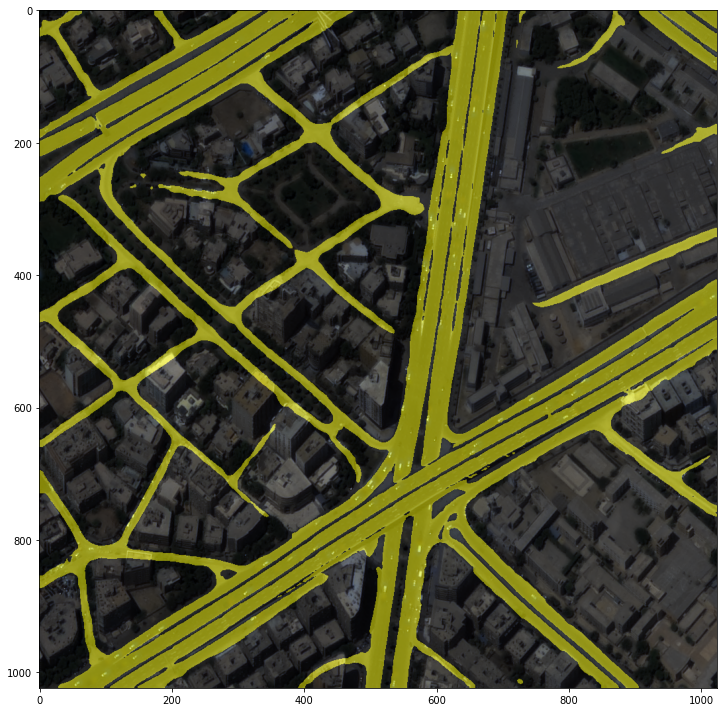

In [16]:
img_result = ['BLD00002_PS3_K3A_NIA0276.png',
              'BLD00010_PS3_K3A_NIA0276.png',
              'BLD00047_PS3_K3A_NIA0276.png',
              'BLD12071_PS3_K3A_NIA0391.png',
              'BLD11907_PS3_K3A_NIA0391.png',
              'BLD11611_PS3_K3A_NIA0390.png',
              'BLD11474_PS3_K3A_NIA0390.png',
              'BLD10413_PS3_K3A_NIA0388.png',
              'BLD10150_PS3_K3A_NIA0388.png',
              'BLD00836_PS3_K3A_NIA0277.png']

checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/FL_cutout/iter_20000.pth'  #학습된 모델


# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

for ir in range(len(img_result)):
  img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/road_dataset/img_dir/val/'+img_result[ir])
  result = inference_segmentor(model_ckpt, img)
  show_result_pyplot(model_ckpt, img, result, palette)


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/FL_cutout/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


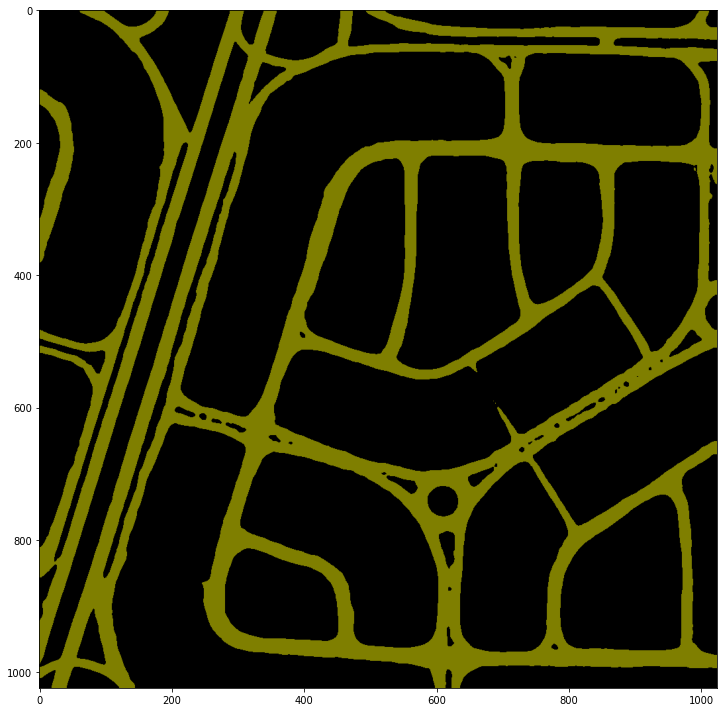

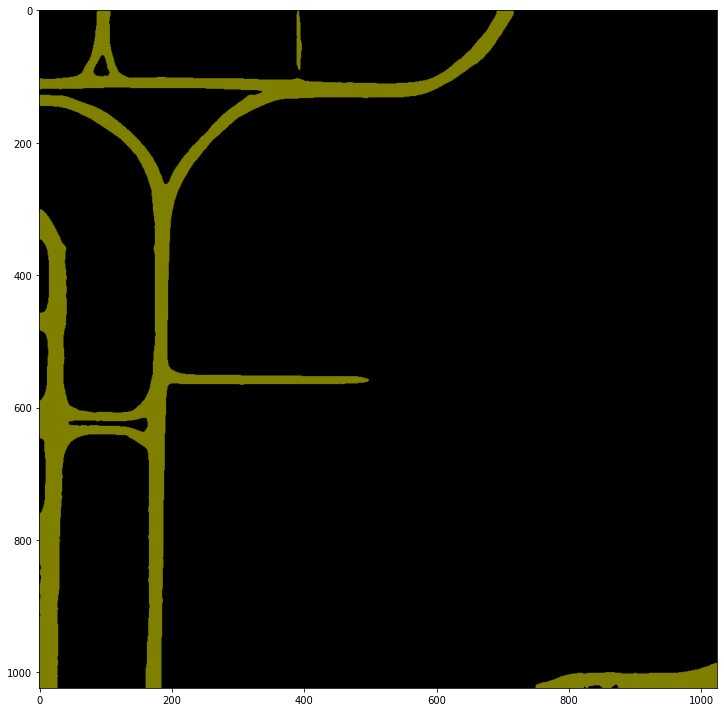

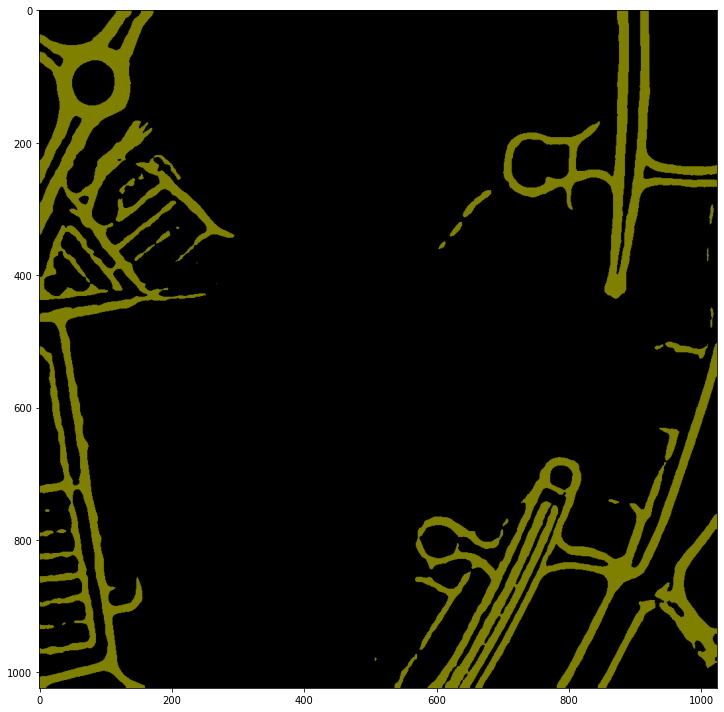

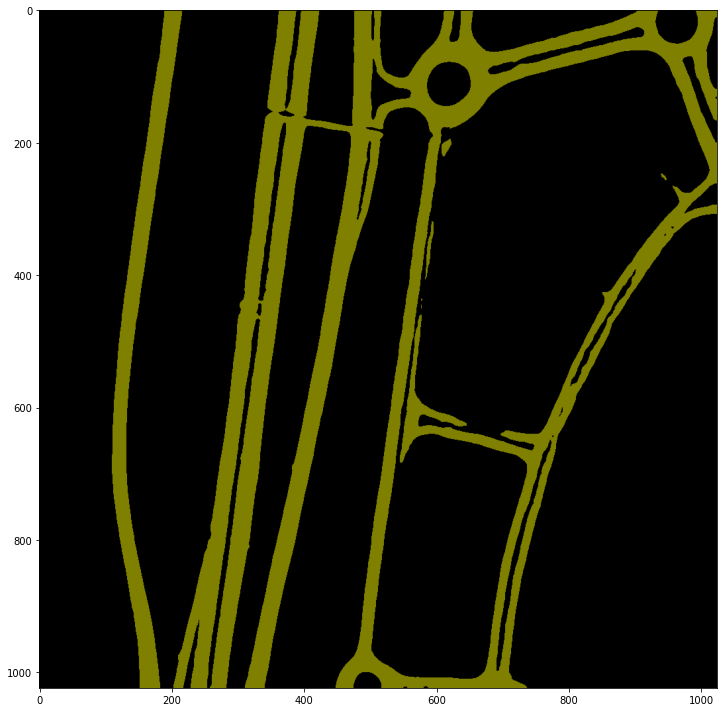

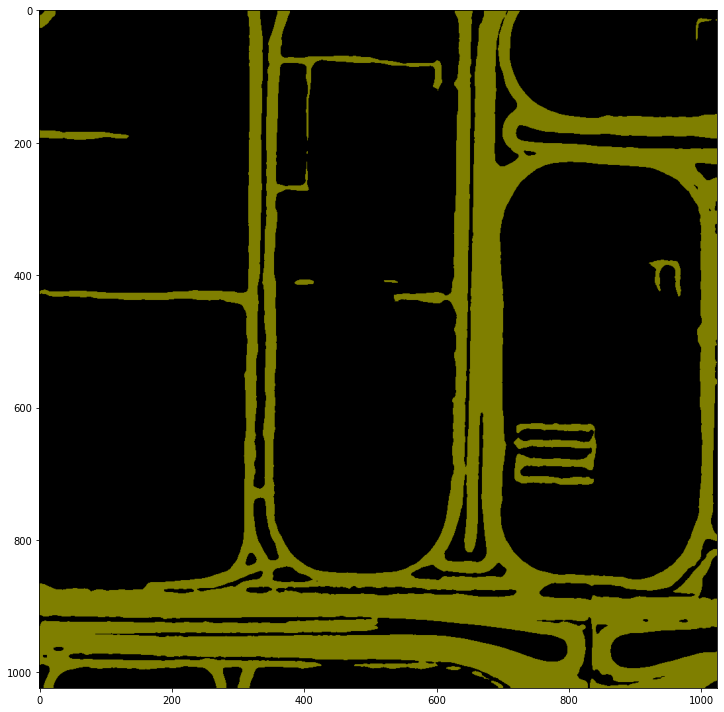

...

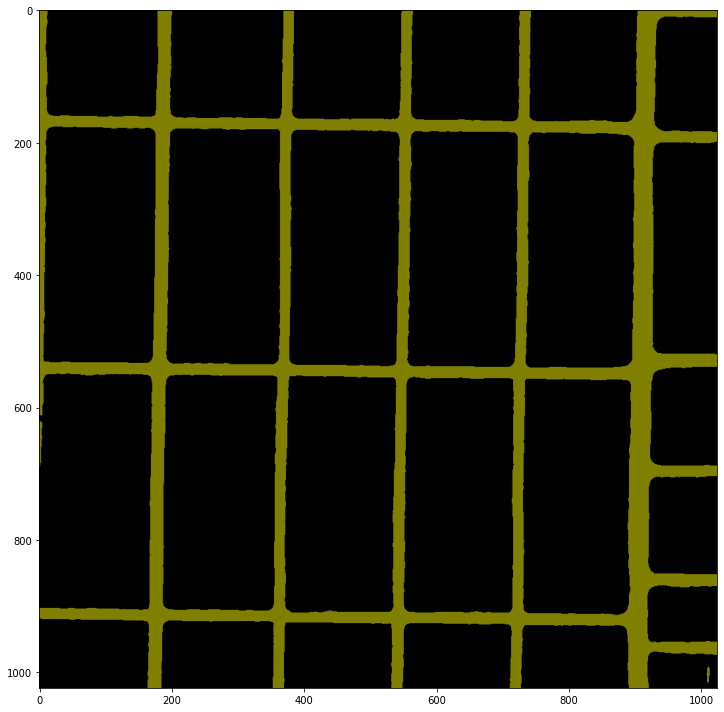

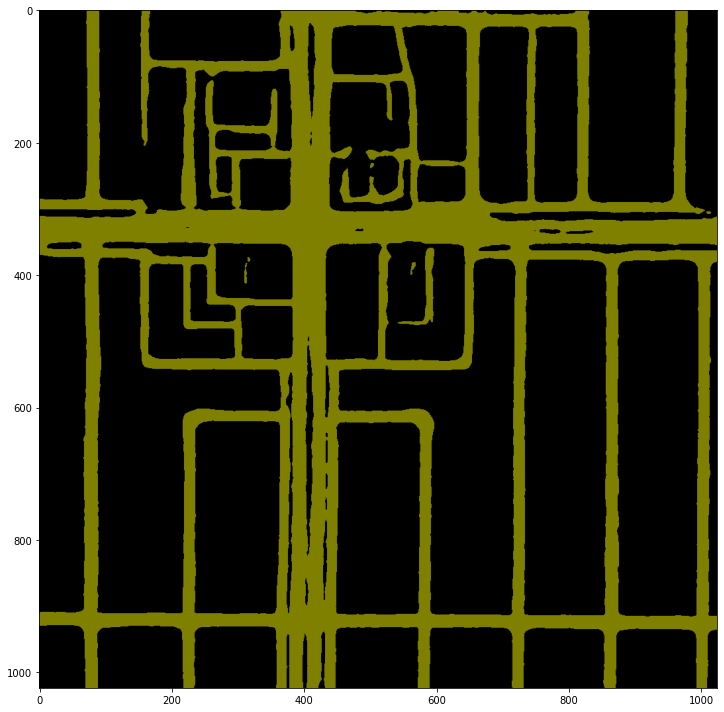

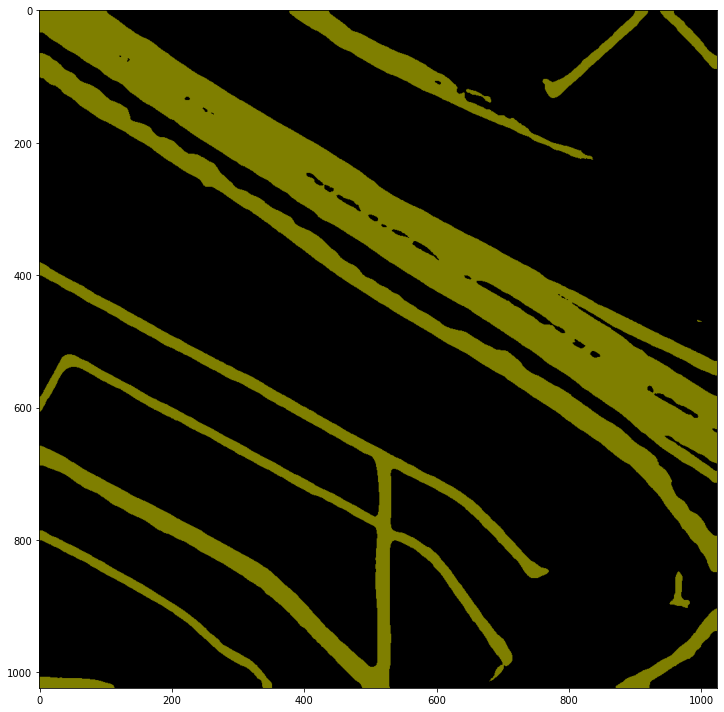

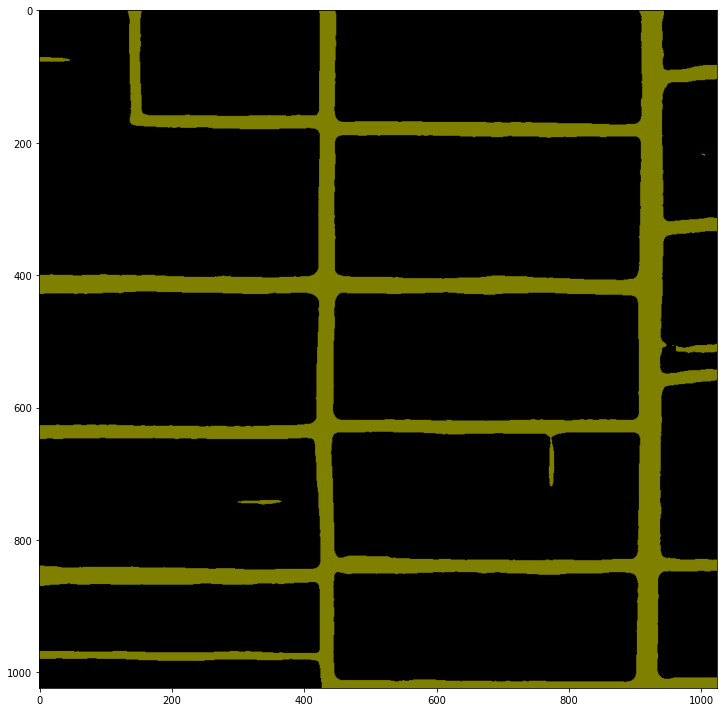

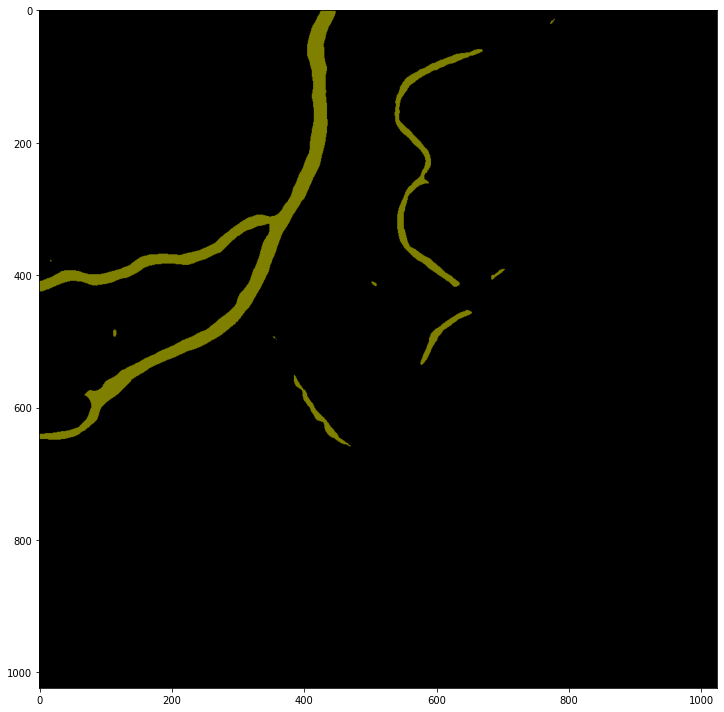

In [17]:
import os
file_list = os.listdir('/content/drive/MyDrive/SIA/Data_set/road_dataset/img_dir/val')
test_png = []
for i in file_list:
  if '.png' in i:
    test_png.append(i)

checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/FL_cutout/iter_20000.pth'  #학습된 모델

model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용
img2 = np.zeros((1024,1024,3),np.uint8)

for j in test_png:
  img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/road_dataset/img_dir/val/'+j)
  result = inference_segmentor(model_ckpt, img)
  show_result_pyplot(model_ckpt, img2, result, palette)
  model_ckpt.show_result(img2, result, out_file= f'/content/drive/MyDrive/SIA/inference_image_road_test/{j}')